In [1]:
%load_ext autoreload
%autoreload 2

## Importing libraries

In [2]:
#%autoreload # When utils.py is updated
#from utils_unet_resunet import *
from ops import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#from model.models import Model_3
import numpy as np
import os
import matplotlib.pyplot as plt

## Defining parameters

In [3]:
raw_path = 'raw' 
dest_path = 'imgs'

lim_x0 = 0
lim_y0 = 0

lim_x = 17730
lim_y = 9203

## Prepare No cloudy - No cloudy data

raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B1_B2_B3.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B4_B5_B6.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B7_B8_B8A.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B9_B10_B11.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B12.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B1_B2_B3.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B4_B5_B6.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B7_B8_B8A.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B9_B10_B11.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B12.tif
raw\no cloudy\2018\COPERNICUS_S1_20180719_20180726_VH.tif
raw\no cloudy\2018\COPERNICUS_S1_20180719_20180726_VV.tif
raw\no cloudy\2019\COPERNICUS_S1_20190721_20190726_VH.tif
raw\no cloudy\2019\COPERNICUS_S1_20190721_20190726_VV.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OPT Min:-7.324285984039307; Max:15.01979923248291
SAR Min:-1.2027642726898193; Max:8.056313514709473
Image stack: (17730, 9203, 30)
Total no-deforestaion class is 100994609
Total deforestaion class is 1842247
Total past deforestaion class is 60332334
Percentage of deforestaion class is 1.82


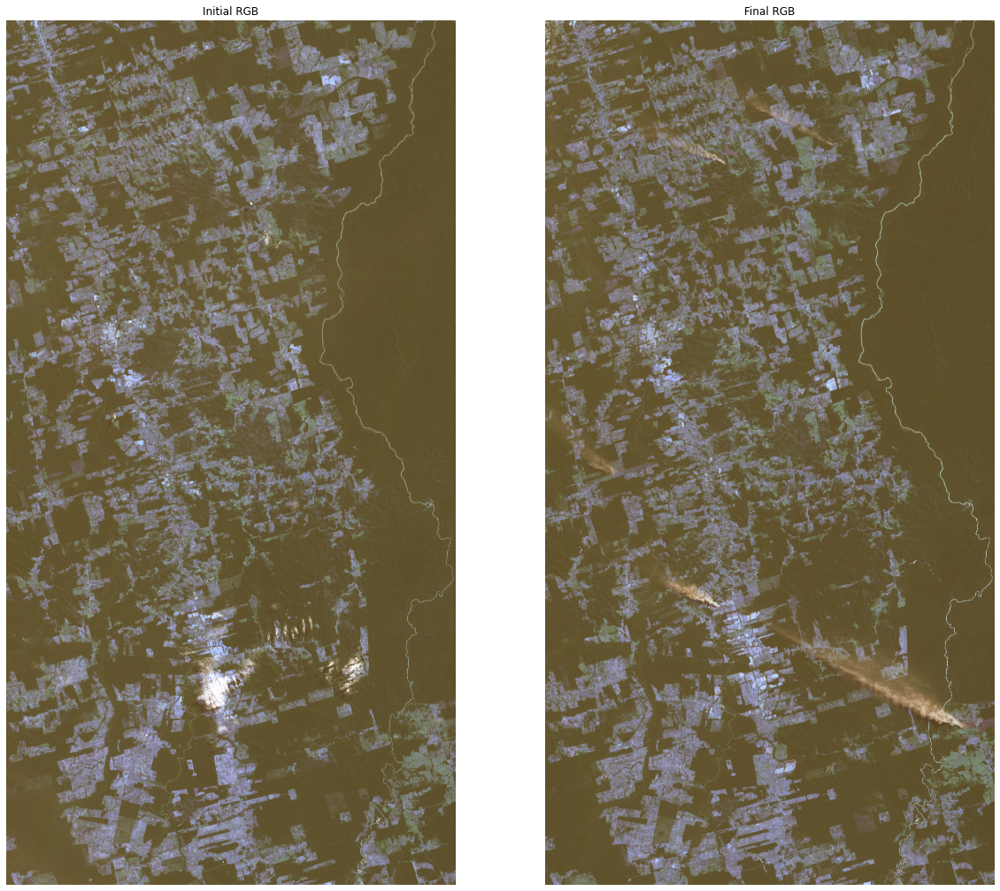

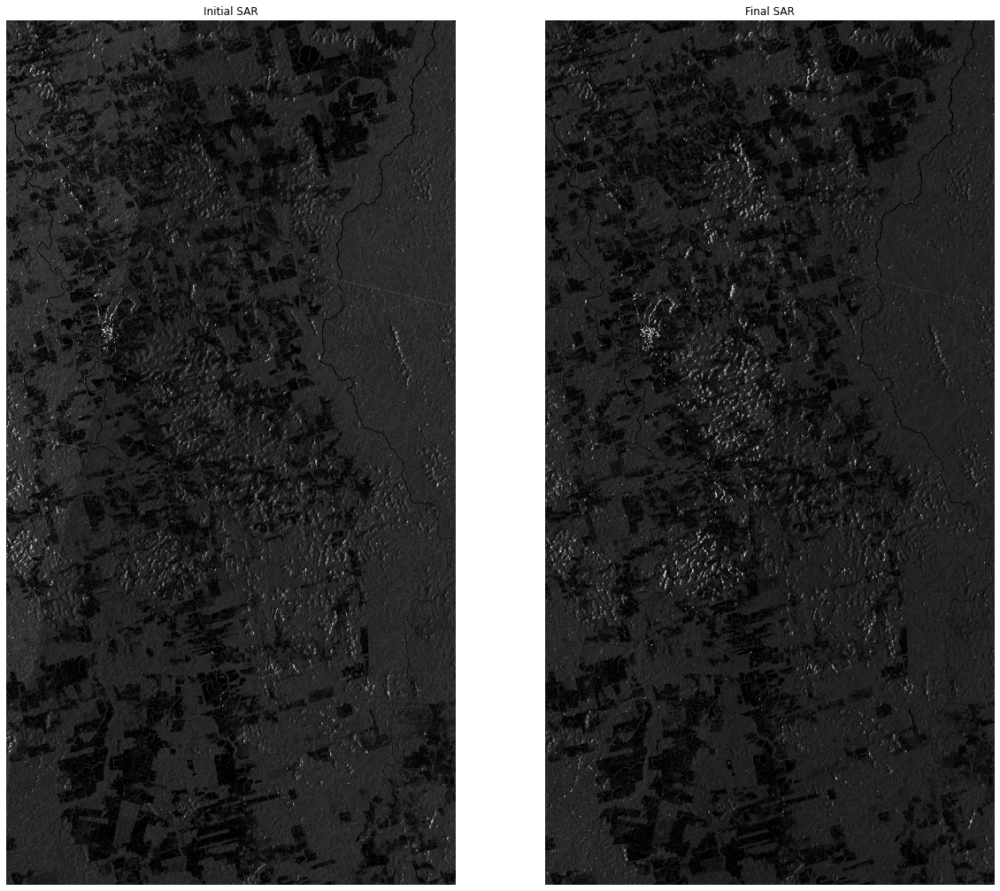

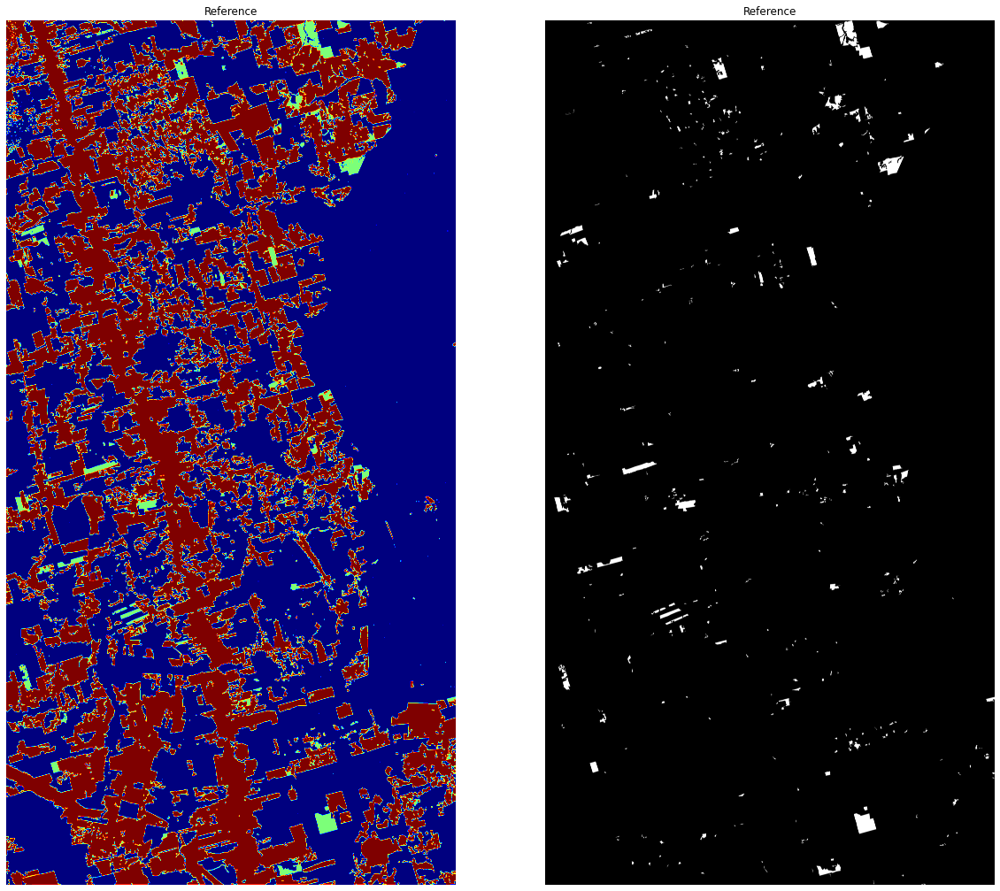

In [4]:
sent2_2018_1 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B1_B2_B3.tif')).astype('float32')
sent2_2018_2 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B4_B5_B6.tif')).astype('float32')
sent2_2018_3 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B7_B8_B8A.tif')).astype('float32')
sent2_2018_4 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B9_B10_B11.tif')).astype('float32')
sent2_2018_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B12.tif')).astype('float32'), axis=-1)

sent2_2018 = np.concatenate((sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5), axis=-1)

del sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5

sent2_2019_1 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B1_B2_B3.tif')).astype('float32')
sent2_2019_2 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B4_B5_B6.tif')).astype('float32')
sent2_2019_3 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B7_B8_B8A.tif')).astype('float32')
sent2_2019_4 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B9_B10_B11.tif')).astype('float32')
sent2_2019_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B12.tif')).astype('float32'), axis=-1)

sent2_2019 = np.concatenate((sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5), axis=-1)

del sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5

# Filter outliers
sent2_2018 = filter_outliers(sent2_2018.copy()) 
sent2_2019 = filter_outliers(sent2_2019.copy()) 

opt_image_stack = np.concatenate((sent2_2018, sent2_2019), axis=-1)

del sent2_2018, sent2_2019

sar_2018_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VH.tif')).astype('float32'), axis = -1)
sar_2018_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VV.tif')).astype('float32'), axis = -1)
sar_2019_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VH.tif')).astype('float32'), axis = -1)
sar_2019_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VV.tif')).astype('float32'), axis = -1)

sar_2018 = np.concatenate((sar_2018_vh, sar_2018_vv), axis=-1)
sar_2019 = np.concatenate((sar_2019_vh, sar_2019_vv), axis=-1)
del sar_2018_vh, sar_2018_vv, sar_2019_vh, sar_2019_vv

# Filter outliers
sar_2018 = filter_outliers(sar_2018.copy()) 
sar_2019 = filter_outliers(sar_2019.copy()) 

sar_image_stack = np.concatenate((sar_2018, sar_2019), axis=-1)
del sar_2018, sar_2019

#masking
final_mask1 = np.load(os.path.join(raw_path, 'mask_label_17730x9203.npy'))

opt_image_stack = opt_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
sar_image_stack = sar_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
final_mask1 = final_mask1[lim_x0:lim_x, lim_y0:lim_y]


fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial RGB')
ax1.imshow(opt_image_stack[:,:,1:4]/2048)
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final RGB')
ax2.imshow(opt_image_stack[:,:,14:17]/2048)
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial SAR')
ax1.imshow(sar_image_stack[:,:,0], cmap='gray')
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final SAR')
ax2.imshow(sar_image_stack[:,:,2], cmap='gray')
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title(f'Reference')
ax1.imshow(final_mask1, cmap ='jet')
ax1.axis('off')

ax1 = fig.add_subplot(122)
plt.title(f'Reference')
ax1.imshow((final_mask1==1), cmap ='gray')
ax1.axis('off')

#normalizing
type_norm = 1
opt_image_array = normalization(opt_image_stack.copy(), type_norm)
del opt_image_stack
print(f'OPT Min:{np.min(opt_image_array)}; Max:{np.max(opt_image_array)}')
sar_image_array = normalization(sar_image_stack.copy(), type_norm)
del sar_image_stack
print(f'SAR Min:{np.min(sar_image_array)}; Max:{np.max(sar_image_array)}')

#concatenate SAR and OPT
image_stack = np.concatenate((opt_image_array, sar_image_array), axis=-1)
print('Image stack:', image_stack.shape)

np.save(os.path.join(dest_path, 'fus_stack_n_n.npy'), image_stack)
np.save(os.path.join(dest_path, 'final_mask1.npy'), final_mask1)

print('Total no-deforestaion class is {}'.format(len(final_mask1[final_mask1==0])))
print('Total deforestaion class is {}'.format(len(final_mask1[final_mask1==1])))
print('Total past deforestaion class is {}'.format(len(final_mask1[final_mask1==2])))
print('Percentage of deforestaion class is {:.2f}'.format((len(final_mask1[final_mask1==1])*100)/len(final_mask1[final_mask1==0])))

del image_stack, opt_image_array, sar_image_array, final_mask1

## Prepare no cloudy - cloudy data

raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B1_B2_B3.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B4_B5_B6.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B7_B8_B8A.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B9_B10_B11.tif
raw\no cloudy\2018\COPERNICUS_S2_20180721_20180726_B12.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B1_B2_B3.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B4_B5_B6.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B7_B8_B8A.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B9_B10_B11.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B12.tif
raw\no cloudy\2018\COPERNICUS_S1_20180719_20180726_VH.tif
raw\no cloudy\2018\COPERNICUS_S1_20180719_20180726_VV.tif
raw\cloudy\2019\COPERNICUS_S1_20190721_20190726_VH.tif
raw\cloudy\2019\COPERNICUS_S1_20190721_20190726_VV.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OPT Min:-6.527342319488525; Max:17.733842849731445
SAR Min:-1.2027642726898193; Max:8.056313514709473
Image stack: (17730, 9203, 30)
Total no-deforestaion class is 100994609
Total deforestaion class is 1842247
Total past deforestaion class is 60332334
Percentage of deforestaion class is 1.82


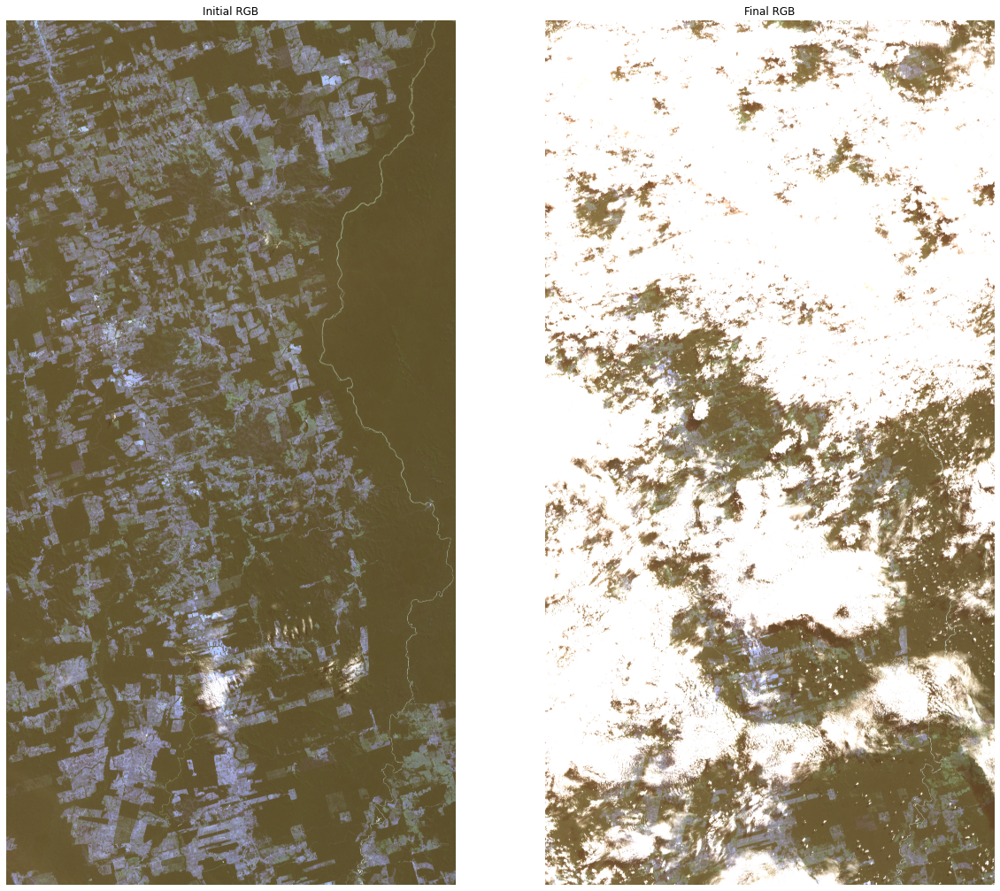

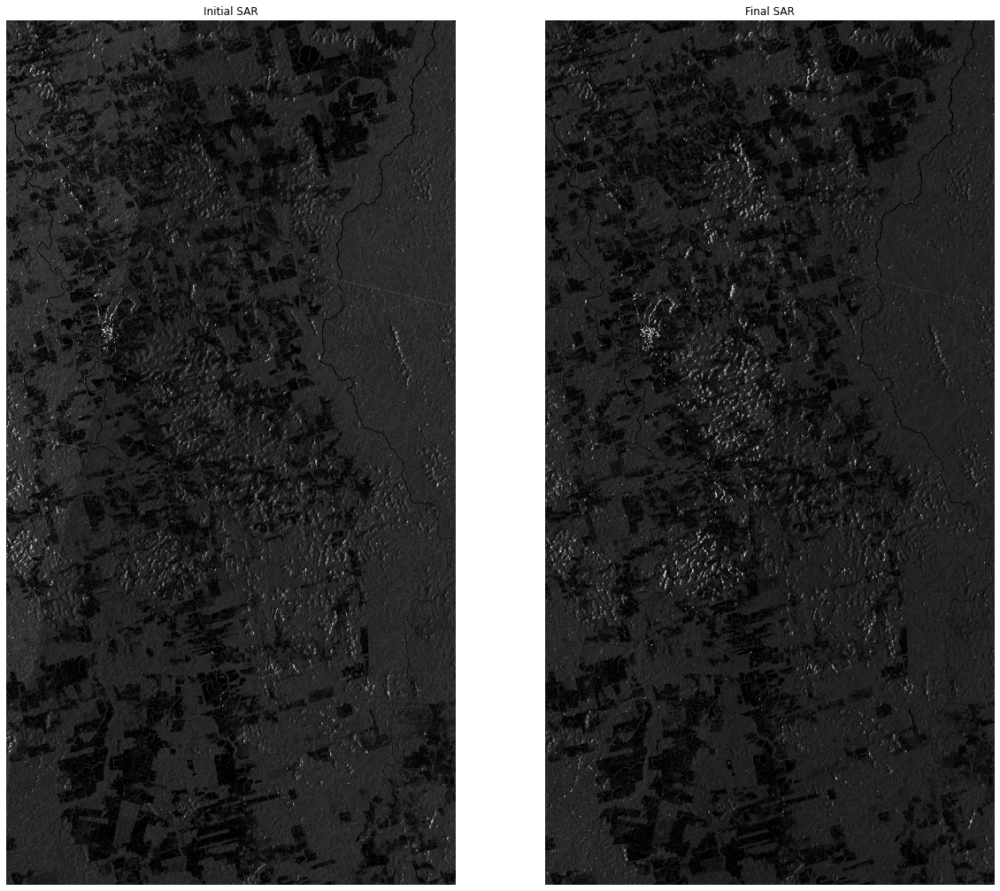

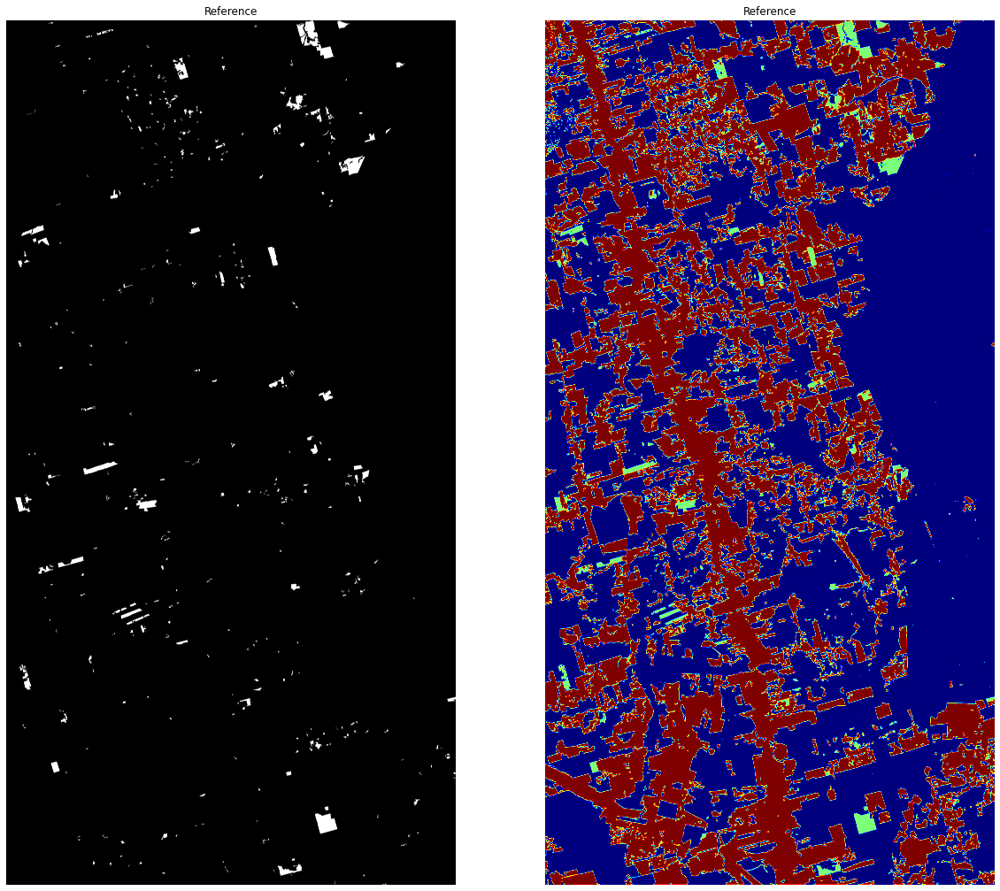

In [5]:
sent2_2018_1 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B1_B2_B3.tif')).astype('float32')
sent2_2018_2 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B4_B5_B6.tif')).astype('float32')
sent2_2018_3 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B7_B8_B8A.tif')).astype('float32')
sent2_2018_4 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B9_B10_B11.tif')).astype('float32')
sent2_2018_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S2_20180721_20180726_B12.tif')).astype('float32'), axis=-1)

sent2_2018 = np.concatenate((sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5), axis=-1)

del sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5

sent2_2019_1 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B1_B2_B3.tif')).astype('float32')
sent2_2019_2 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B4_B5_B6.tif')).astype('float32')
sent2_2019_3 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B7_B8_B8A.tif')).astype('float32')
sent2_2019_4 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B9_B10_B11.tif')).astype('float32')
sent2_2019_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B12.tif')).astype('float32'), axis=-1)

sent2_2019 = np.concatenate((sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5), axis=-1)

del sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5

# Filter outliers
sent2_2018 = filter_outliers(sent2_2018.copy()) 
sent2_2019 = filter_outliers(sent2_2019.copy()) 

opt_image_stack = np.concatenate((sent2_2018, sent2_2019), axis=-1)

del sent2_2018, sent2_2019

sar_2018_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VH.tif')).astype('float32'), axis = -1)
sar_2018_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VV.tif')).astype('float32'), axis = -1)
sar_2019_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VH.tif')).astype('float32'), axis = -1)
sar_2019_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VV.tif')).astype('float32'), axis = -1)

sar_2018 = np.concatenate((sar_2018_vh, sar_2018_vv), axis=-1)
sar_2019 = np.concatenate((sar_2019_vh, sar_2019_vv), axis=-1)
del sar_2018_vh, sar_2018_vv, sar_2019_vh, sar_2019_vv

# Filter outliers
sar_2018 = filter_outliers(sar_2018.copy()) 
sar_2019 = filter_outliers(sar_2019.copy()) 

sar_image_stack = np.concatenate((sar_2018, sar_2019), axis=-1)
del sar_2018, sar_2019

#masking
final_mask1 = np.load(os.path.join(raw_path, 'mask_label_17730x9203.npy'))

opt_image_stack = opt_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
sar_image_stack = sar_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
final_mask1 = final_mask1[lim_x0:lim_x, lim_y0:lim_y]

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial RGB')
ax1.imshow(opt_image_stack[:,:,1:4]/2048)
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final RGB')
ax2.imshow(opt_image_stack[:,:,14:17]/2048)
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial SAR')
ax1.imshow(sar_image_stack[:,:,0], cmap='gray')
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final SAR')
ax2.imshow(sar_image_stack[:,:,2], cmap='gray')
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title(f'Reference')
ax1.imshow((final_mask1==1), cmap ='gray')
ax1.axis('off')

ax1 = fig.add_subplot(122)
plt.title(f'Reference')
ax1.imshow(final_mask1, cmap ='jet')
ax1.axis('off')

#normalizing
type_norm = 1
opt_image_array = normalization(opt_image_stack.copy(), type_norm)
del opt_image_stack
print(f'OPT Min:{np.min(opt_image_array)}; Max:{np.max(opt_image_array)}')
sar_image_array = normalization(sar_image_stack.copy(), type_norm)
del sar_image_stack
print(f'SAR Min:{np.min(sar_image_array)}; Max:{np.max(sar_image_array)}')

#concatenate SAR and OPT
image_stack = np.concatenate((opt_image_array, sar_image_array), axis=-1)
print('Image stack:', image_stack.shape)

#np.save(os.path.join(dest_path, 'opt_stack_cloudy.npy'), opt_image_array)
#np.save(os.path.join(dest_path, 'sar_stack_cloudy.npy'), sar_image_array)
np.save(os.path.join(dest_path, 'fus_stack_n_c.npy'), image_stack)
#np.save(os.path.join(dest_path, 'final_mask1.npy'), final_mask1)

del image_stack, opt_image_array, sar_image_array

print('Total no-deforestaion class is {}'.format(len(final_mask1[final_mask1==0])))
print('Total deforestaion class is {}'.format(len(final_mask1[final_mask1==1])))
print('Total past deforestaion class is {}'.format(len(final_mask1[final_mask1==2])))
print('Percentage of deforestaion class is {:.2f}'.format((len(final_mask1[final_mask1==1])*100)/len(final_mask1[final_mask1==0])))

del final_mask1

## Prepare cloudy - cloudy data

raw\cloudy\2018\COPERNICUS_S2_20180611_B1_B2_B3.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B4_B5_B6.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B7_B8_B8A.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B9_B10_B11.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B12.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B1_B2_B3.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B4_B5_B6.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B7_B8_B8A.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B9_B10_B11.tif
raw\cloudy\2019\COPERNICUS_S2_20190706_B12.tif
raw\cloudy\2018\COPERNICUS_S1_20180719_20180726_VH.tif
raw\cloudy\2018\COPERNICUS_S1_20180719_20180726_VV.tif
raw\cloudy\2019\COPERNICUS_S1_20190721_20190726_VH.tif
raw\cloudy\2019\COPERNICUS_S1_20190721_20190726_VV.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OPT Min:-1.7514984607696533; Max:17.733842849731445
SAR Min:-1.2027642726898193; Max:8.056313514709473
Image stack: (17730, 9203, 30)
Total no-deforestaion class is 100994609
Total deforestaion class is 1842247
Total past deforestaion class is 60332334
Percentage of deforestaion class is 1.82


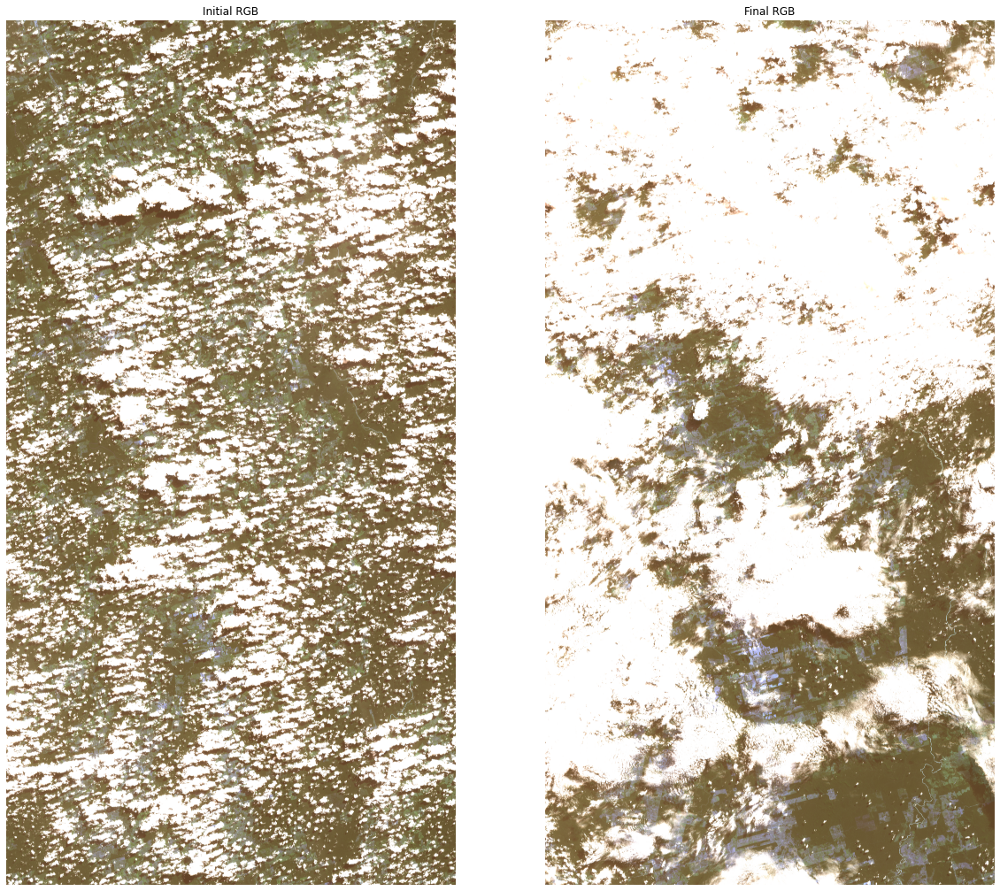

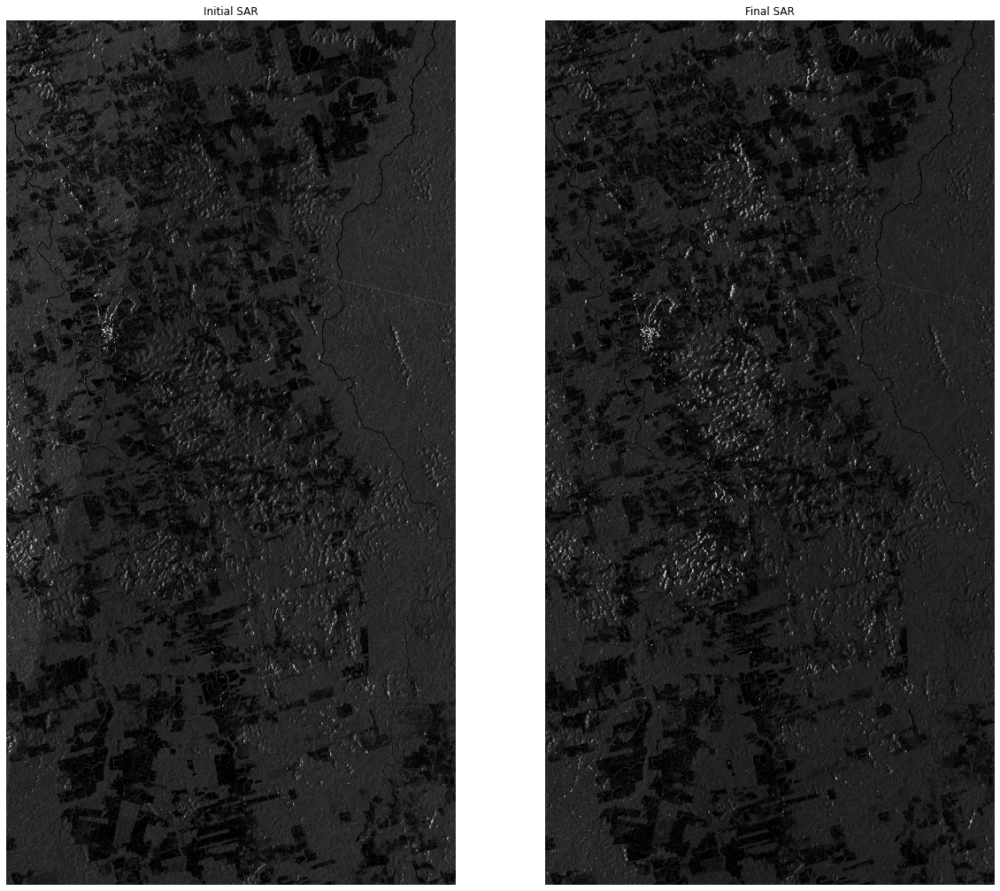

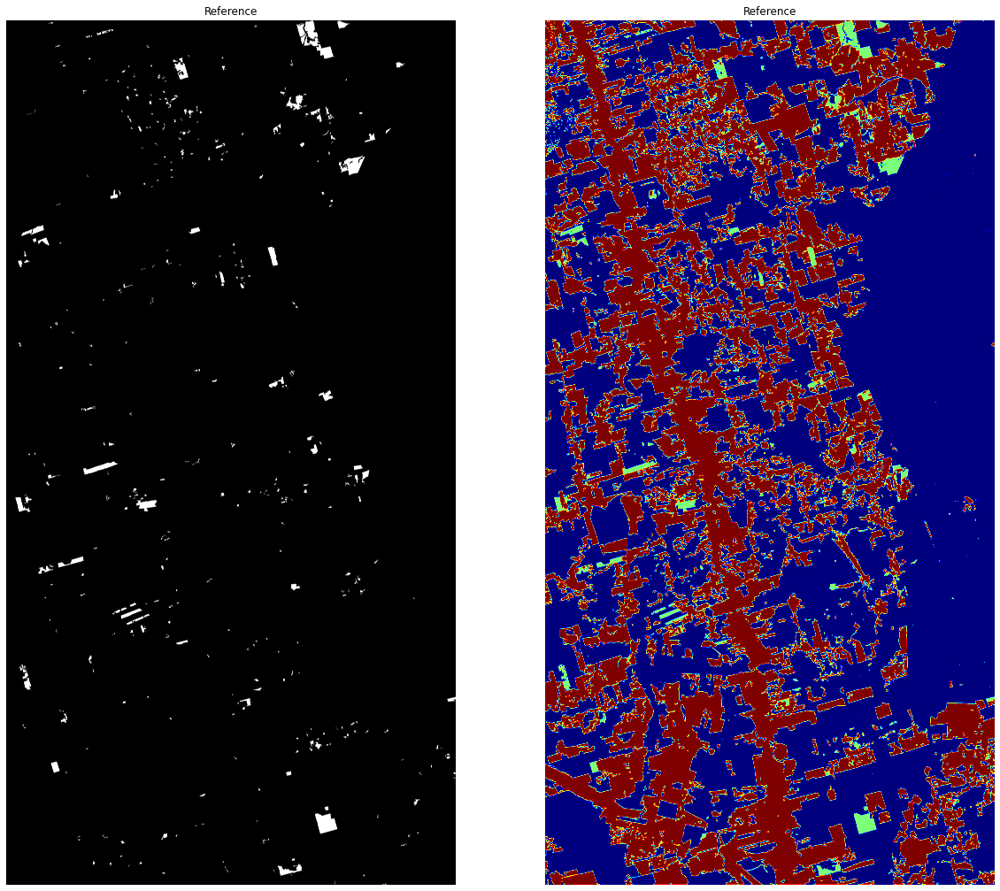

In [6]:
sent2_2018_1 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B1_B2_B3.tif')).astype('float32')
sent2_2018_2 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B4_B5_B6.tif')).astype('float32')
sent2_2018_3 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B7_B8_B8A.tif')).astype('float32')
sent2_2018_4 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B9_B10_B11.tif')).astype('float32')
sent2_2018_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B12.tif')).astype('float32'), axis=-1)

sent2_2018 = np.concatenate((sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5), axis=-1)

del sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5

sent2_2019_1 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B1_B2_B3.tif')).astype('float32')
sent2_2019_2 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B4_B5_B6.tif')).astype('float32')
sent2_2019_3 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B7_B8_B8A.tif')).astype('float32')
sent2_2019_4 = load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B9_B10_B11.tif')).astype('float32')
sent2_2019_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S2_20190706_B12.tif')).astype('float32'), axis=-1)

sent2_2019 = np.concatenate((sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5), axis=-1)

del sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5

# Filter outliers
sent2_2018 = filter_outliers(sent2_2018.copy()) 
sent2_2019 = filter_outliers(sent2_2019.copy()) 

opt_image_stack = np.concatenate((sent2_2018, sent2_2019), axis=-1)

del sent2_2018, sent2_2019

sar_2018_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VH.tif')).astype('float32'), axis = -1)
sar_2018_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VV.tif')).astype('float32'), axis = -1)
sar_2019_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VH.tif')).astype('float32'), axis = -1)
sar_2019_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VV.tif')).astype('float32'), axis = -1)

sar_2018 = np.concatenate((sar_2018_vh, sar_2018_vv), axis=-1)
sar_2019 = np.concatenate((sar_2019_vh, sar_2019_vv), axis=-1)
del sar_2018_vh, sar_2018_vv, sar_2019_vh, sar_2019_vv

# Filter outliers
sar_2018 = filter_outliers(sar_2018.copy()) 
sar_2019 = filter_outliers(sar_2019.copy()) 

sar_image_stack = np.concatenate((sar_2018, sar_2019), axis=-1)
del sar_2018, sar_2019

#masking
final_mask1 = np.load(os.path.join(raw_path, 'mask_label_17730x9203.npy'))

opt_image_stack = opt_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
sar_image_stack = sar_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
final_mask1 = final_mask1[lim_x0:lim_x, lim_y0:lim_y]

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial RGB')
ax1.imshow(opt_image_stack[:,:,1:4]/2048)
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final RGB')
ax2.imshow(opt_image_stack[:,:,14:17]/2048)
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial SAR')
ax1.imshow(sar_image_stack[:,:,0], cmap='gray')
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final SAR')
ax2.imshow(sar_image_stack[:,:,2], cmap='gray')
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title(f'Reference')
ax1.imshow((final_mask1==1), cmap ='gray')
ax1.axis('off')

ax1 = fig.add_subplot(122)
plt.title(f'Reference')
ax1.imshow(final_mask1, cmap ='jet')
ax1.axis('off')

#normalizing
type_norm = 1
opt_image_array = normalization(opt_image_stack.copy(), type_norm)
del opt_image_stack
print(f'OPT Min:{np.min(opt_image_array)}; Max:{np.max(opt_image_array)}')
sar_image_array = normalization(sar_image_stack.copy(), type_norm)
del sar_image_stack
print(f'SAR Min:{np.min(sar_image_array)}; Max:{np.max(sar_image_array)}')

#concatenate SAR and OPT
image_stack = np.concatenate((opt_image_array, sar_image_array), axis=-1)
print('Image stack:', image_stack.shape)

#np.save(os.path.join(dest_path, 'opt_stack_cloudy.npy'), opt_image_array)
#np.save(os.path.join(dest_path, 'sar_stack_cloudy.npy'), sar_image_array)
np.save(os.path.join(dest_path, 'fus_stack_c_c.npy'), image_stack)
#np.save(os.path.join(dest_path, 'final_mask1.npy'), final_mask1)

del image_stack, opt_image_array, sar_image_array

print('Total no-deforestaion class is {}'.format(len(final_mask1[final_mask1==0])))
print('Total deforestaion class is {}'.format(len(final_mask1[final_mask1==1])))
print('Total past deforestaion class is {}'.format(len(final_mask1[final_mask1==2])))
print('Percentage of deforestaion class is {:.2f}'.format((len(final_mask1[final_mask1==1])*100)/len(final_mask1[final_mask1==0])))

del final_mask1

## Prepare cloudy - no cloudy data

raw\cloudy\2018\COPERNICUS_S2_20180611_B1_B2_B3.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B4_B5_B6.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B7_B8_B8A.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B9_B10_B11.tif
raw\cloudy\2018\COPERNICUS_S2_20180611_B12.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B1_B2_B3.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B4_B5_B6.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B7_B8_B8A.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B9_B10_B11.tif
raw\no cloudy\2019\COPERNICUS_S2_20190721_20190726_B12.tif
raw\cloudy\2018\COPERNICUS_S1_20180719_20180726_VH.tif
raw\cloudy\2018\COPERNICUS_S1_20180719_20180726_VV.tif
raw\no cloudy\2019\COPERNICUS_S1_20190721_20190726_VH.tif
raw\no cloudy\2019\COPERNICUS_S1_20190721_20190726_VV.tif


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OPT Min:-7.324285984039307; Max:15.01979923248291
SAR Min:-1.2027642726898193; Max:8.056313514709473
Image stack: (17730, 9203, 30)
Total no-deforestaion class is 100994609
Total deforestaion class is 1842247
Total past deforestaion class is 60332334
Percentage of deforestaion class is 1.82


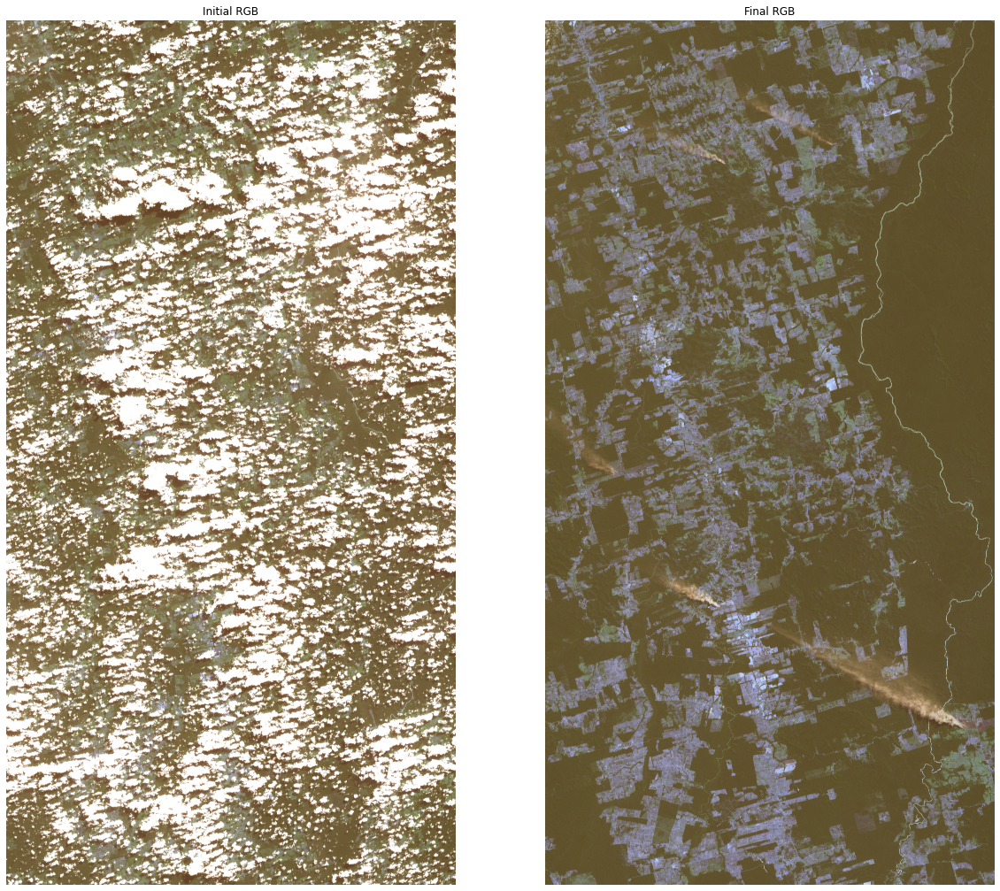

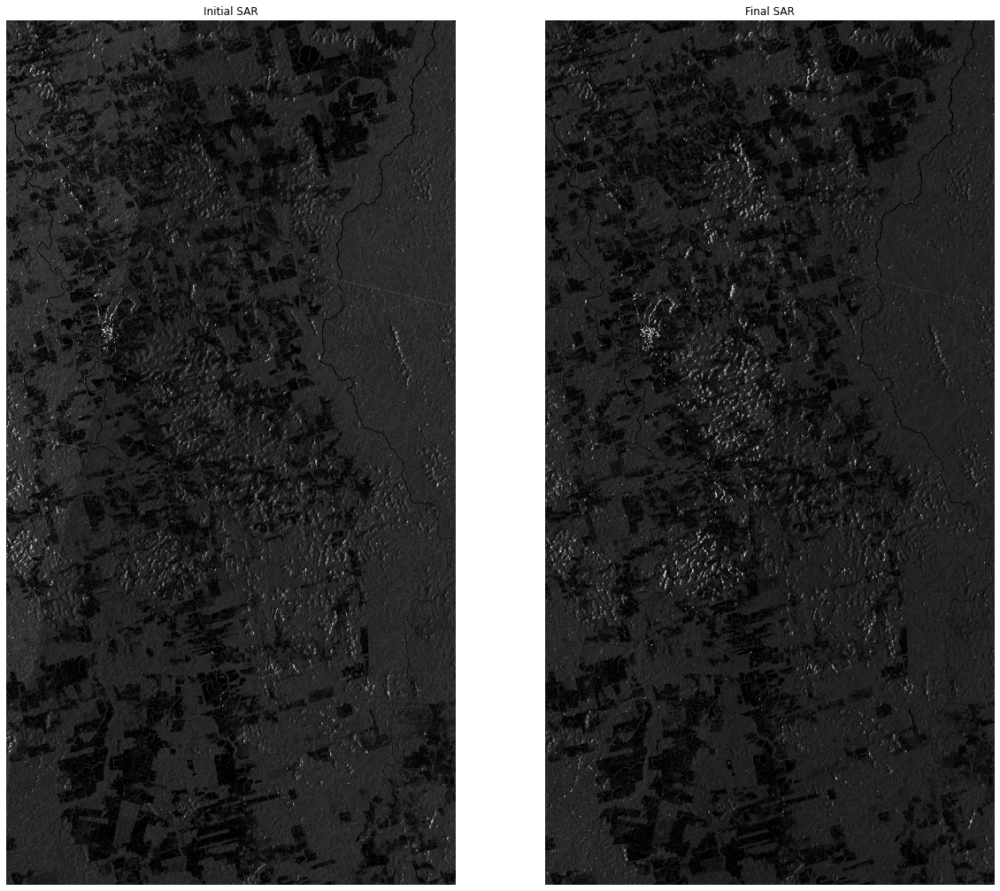

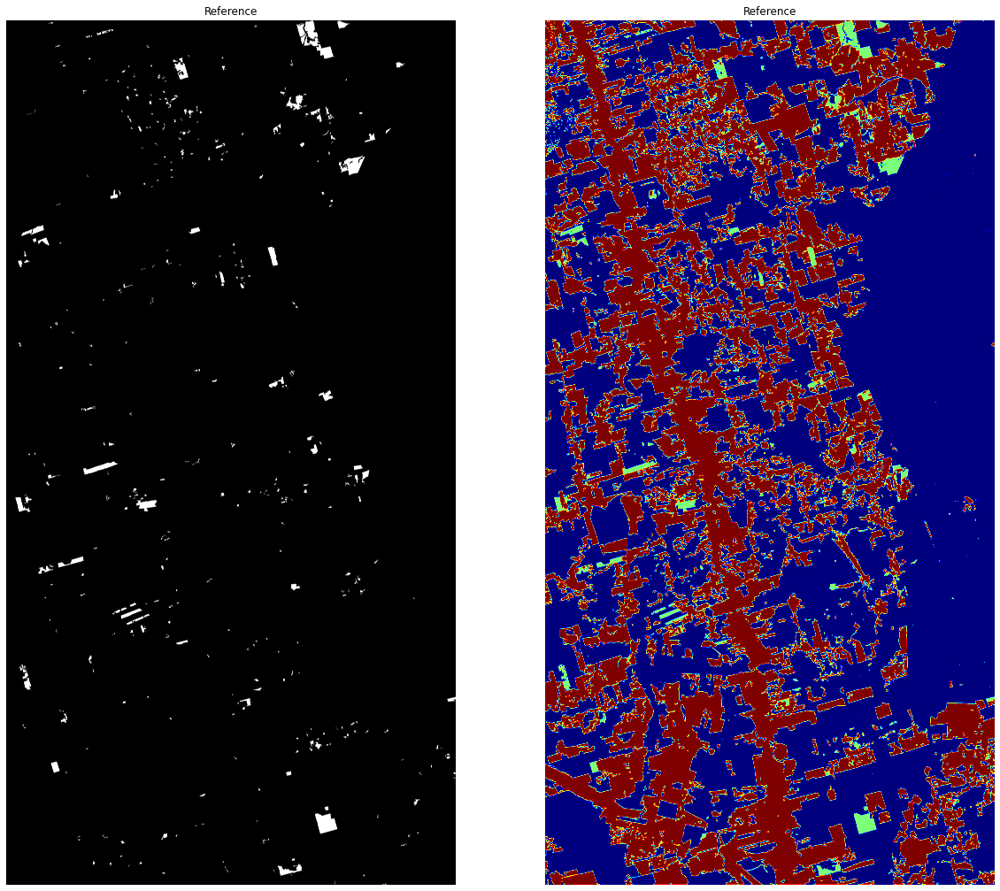

In [7]:
sent2_2018_1 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B1_B2_B3.tif')).astype('float32')
sent2_2018_2 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B4_B5_B6.tif')).astype('float32')
sent2_2018_3 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B7_B8_B8A.tif')).astype('float32')
sent2_2018_4 = load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B9_B10_B11.tif')).astype('float32')
sent2_2018_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S2_20180611_B12.tif')).astype('float32'), axis=-1)

sent2_2018 = np.concatenate((sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5), axis=-1)

del sent2_2018_1, sent2_2018_2, sent2_2018_3, sent2_2018_4, sent2_2018_5

sent2_2019_1 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B1_B2_B3.tif')).astype('float32')
sent2_2019_2 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B4_B5_B6.tif')).astype('float32')
sent2_2019_3 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B7_B8_B8A.tif')).astype('float32')
sent2_2019_4 = load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B9_B10_B11.tif')).astype('float32')
sent2_2019_5 = np.expand_dims(load_tif_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S2_20190721_20190726_B12.tif')).astype('float32'), axis=-1)

sent2_2019 = np.concatenate((sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5), axis=-1)

del sent2_2019_1, sent2_2019_2, sent2_2019_3, sent2_2019_4, sent2_2019_5

# Filter outliers
sent2_2018 = filter_outliers(sent2_2018.copy()) 
sent2_2019 = filter_outliers(sent2_2019.copy()) 

opt_image_stack = np.concatenate((sent2_2018, sent2_2019), axis=-1)

del sent2_2018, sent2_2019

sar_2018_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VH.tif')).astype('float32'), axis = -1)
sar_2018_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'cloudy', '2018', 'COPERNICUS_S1_20180719_20180726_VV.tif')).astype('float32'), axis = -1)
sar_2019_vh = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VH.tif')).astype('float32'), axis = -1)
sar_2019_vv = np.expand_dims(load_SAR_image(os.path.join(raw_path, 'no cloudy', '2019', 'COPERNICUS_S1_20190721_20190726_VV.tif')).astype('float32'), axis = -1)

sar_2018 = np.concatenate((sar_2018_vh, sar_2018_vv), axis=-1)
sar_2019 = np.concatenate((sar_2019_vh, sar_2019_vv), axis=-1)
del sar_2018_vh, sar_2018_vv, sar_2019_vh, sar_2019_vv

# Filter outliers
sar_2018 = filter_outliers(sar_2018.copy()) 
sar_2019 = filter_outliers(sar_2019.copy()) 

sar_image_stack = np.concatenate((sar_2018, sar_2019), axis=-1)
del sar_2018, sar_2019

#masking
final_mask1 = np.load(os.path.join(raw_path, 'mask_label_17730x9203.npy'))

opt_image_stack = opt_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
sar_image_stack = sar_image_stack[lim_x0:lim_x, lim_y0:lim_y, :]
final_mask1 = final_mask1[lim_x0:lim_x, lim_y0:lim_y]

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial RGB')
ax1.imshow(opt_image_stack[:,:,1:4]/2048)
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final RGB')
ax2.imshow(opt_image_stack[:,:,14:17]/2048)
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title('Initial SAR')
ax1.imshow(sar_image_stack[:,:,0], cmap='gray')
ax1.axis('off')

ax2 = fig.add_subplot(122)
plt.title('Final SAR')
ax2.imshow(sar_image_stack[:,:,2], cmap='gray')
ax2.axis('off')

fig = plt.figure(figsize=(20,25))
ax1 = fig.add_subplot(121)
plt.title(f'Reference')
ax1.imshow((final_mask1==1), cmap ='gray')
ax1.axis('off')

ax1 = fig.add_subplot(122)
plt.title(f'Reference')
ax1.imshow(final_mask1, cmap ='jet')
ax1.axis('off')

#normalizing
type_norm = 1
opt_image_array = normalization(opt_image_stack.copy(), type_norm)
del opt_image_stack
print(f'OPT Min:{np.min(opt_image_array)}; Max:{np.max(opt_image_array)}')
sar_image_array = normalization(sar_image_stack.copy(), type_norm)
del sar_image_stack
print(f'SAR Min:{np.min(sar_image_array)}; Max:{np.max(sar_image_array)}')

#concatenate SAR and OPT
image_stack = np.concatenate((opt_image_array, sar_image_array), axis=-1)
print('Image stack:', image_stack.shape)

#np.save(os.path.join(dest_path, 'opt_stack_cloudy.npy'), opt_image_array)
#np.save(os.path.join(dest_path, 'sar_stack_cloudy.npy'), sar_image_array)
np.save(os.path.join(dest_path, 'fus_stack_c_n.npy'), image_stack)
#np.save(os.path.join(dest_path, 'final_mask1.npy'), final_mask1)

del image_stack, opt_image_array, sar_image_array

print('Total no-deforestaion class is {}'.format(len(final_mask1[final_mask1==0])))
print('Total deforestaion class is {}'.format(len(final_mask1[final_mask1==1])))
print('Total past deforestaion class is {}'.format(len(final_mask1[final_mask1==2])))
print('Percentage of deforestaion class is {:.2f}'.format((len(final_mask1[final_mask1==1])*100)/len(final_mask1[final_mask1==0])))

del final_mask1